In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot
from plotly.subplots import make_subplots
import missingno as msno

In [2]:
df_train = pd.read_csv("train.csv")
df_test = pd.read_csv("test.csv")

In [3]:
df_train.head()

,galactic year,galaxy,existence expectancy index,existence expectancy at birth,Gross income per capita,Income Index,Expected years of education (galactic years),Mean years of education (galactic years),Intergalactic Development Index (IDI),Education Index,...,"Intergalactic Development Index (IDI), female","Intergalactic Development Index (IDI), male",Gender Development Index (GDI),"Intergalactic Development Index (IDI), female, Rank","Intergalactic Development Index (IDI), male, Rank",Adjusted net savings,"Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total",Private galaxy capital flows (% of GGP),Gender Inequality Index (GII),y
0,990025,Large Magellanic Cloud (LMC),0.628657,63.125200,27109.234310,0.646039,8.240543,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.052590
1,990025,Camelopardalis B,0.818082,81.004994,30166.793958,0.852246,10.671823,4.742470,0.833624,0.467873,...,NaN,NaN,NaN,NaN,NaN,19.177926,NaN,22.785018,NaN,0.059868
2,990025,Virgo I,0.659443,59.570534,8441.707353,0.499762,8.840316,5.583973,0.469110,0.363837,...,NaN,NaN,NaN,NaN,NaN,21.151265,6.534020,NaN,NaN,0.050449
3,990025,UGC 8651 (DDO 181),0.555862,52.333293,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,5.912194,NaN,NaN,0.049394
4,990025,Tucana Dwarf,0.991196,81.802464,81033.956906,1.131163,13.800672,13.188907,0.910341,0.918353,...,NaN,NaN,NaN,NaN,NaN,NaN,5.611753,NaN,NaN,0.154247


In [5]:
df_train.shape

(3865, 80)

In [6]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3865 entries, 0 to 3864
Data columns (total 80 columns):
 #   Column                                                                                   Non-Null Count  Dtype  
---  ------                                                                                   --------------  -----  
 0   galactic year                                                                            3865 non-null   int64  
 1   galaxy                                                                                   3865 non-null   object 
 2   existence expectancy index                                                               3864 non-null   float64
 3   existence expectancy at birth                                                            3864 non-null   float64
 4   Gross income per capita                                                                  3837 non-null   float64
 5   Income Index                                                  

In [7]:
pd.set_option('display.max_rows', None)

## istatistiksel veriler

In [8]:
df_train.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
galactic year,3865,NaN,NaN,NaN,1.00071e+06,6945.46,990025,995006,1e+06,1.00601e+06,1.01506e+06
galaxy,3865,181,Andromeda XXIV,26,NaN,NaN,NaN,NaN,NaN,NaN,NaN
existence expectancy index,3864,NaN,NaN,NaN,0.872479,0.162367,0.22789,0.763027,0.907359,0.99276,1.24691
existence expectancy at birth,3864,NaN,NaN,NaN,76.7981,10.4617,34.2441,69.9614,78.9951,84.559,100.21
Gross income per capita,3837,NaN,NaN,NaN,31633.2,18736.4,-126.907,20169.1,26600.8,36898.6,151073
Income Index,3837,NaN,NaN,NaN,0.825154,0.194055,0.292001,0.677131,0.8273,0.970295,1.36188
Expected years of education (galactic years),3732,NaN,NaN,NaN,14.7233,3.61255,3.79966,12.5925,14.9429,17.1238,26.9559
Mean years of education (galactic years),3502,NaN,NaN,NaN,10.284,3.31995,1.92817,7.65417,10.3855,12.8848,19.0576
Intergalactic Development Index (IDI),3474,NaN,NaN,NaN,0.804246,0.176242,0.273684,0.671862,0.824758,0.939043,1.23281
Education Index,3474,NaN,NaN,NaN,0.7459,0.199795,0.189874,0.597746,0.761255,0.893505,1.26963


In [9]:
df_train["galaxy"].value_counts()[:10]

Andromeda XXIV                   26
Andromeda XXII[57]               26
Andromeda XII                    26
Tucana Dwarf                     26
Andromeda XIX[60]                26
Pegasus Dwarf Sph (And VI)       25
Pisces V (Andromeda XVI)         25
Pisces IV (Andromeda XIV)        25
IC 1613 (UGC 668)                25
Phoenix Dwarf Galaxy (P 6830)    25
Name: galaxy, dtype: int64

In [4]:
df_train.galaxy = pd.Categorical(df_train.galaxy)

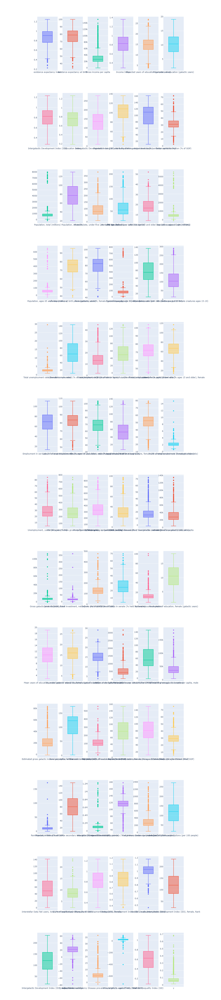

In [13]:
columns = list(df_train.columns)[2:]
fig = make_subplots(rows=13, cols=6)

rowNum = 1
colNum = 1
for num, column in enumerate(columns):               
    fig.add_trace(go.Box(y = df_train[column],
                         name = column
                     ), rowNum,colNum)    
    colNum += 1    
    if num % 6 == 5:
        rowNum += 1
        colNum = 1
    
fig.update_layout(width = 1600, height = 6000, showlegend=False)
iplot(fig)

In [129]:
corr_matrix = df_train.corr()
f, ax = plt.subplots(figsize=(200, 100))

heatmap = sns.heatmap(corr_matrix,
                      linewidths = .5,
                      cmap = "coolwarm",
                      vmin = -1,
                      vmax = 1,
                      annot = True)
f.savefig("heatmap.png")

In [11]:
df_train["y"].corr(df_train["Natural resource depletion"])

-0.22386314810305696

In [12]:
df_train.isnull().sum()

galactic year                                                                                 0
galaxy                                                                                        0
existence expectancy index                                                                    1
existence expectancy at birth                                                                 1
Gross income per capita                                                                      28
Income Index                                                                                 28
Expected years of education (galactic years)                                                133
Mean years of education (galactic years)                                                    363
Intergalactic Development Index (IDI)                                                       391
Education Index                                                                             391
Intergalactic Development Index (IDI), R

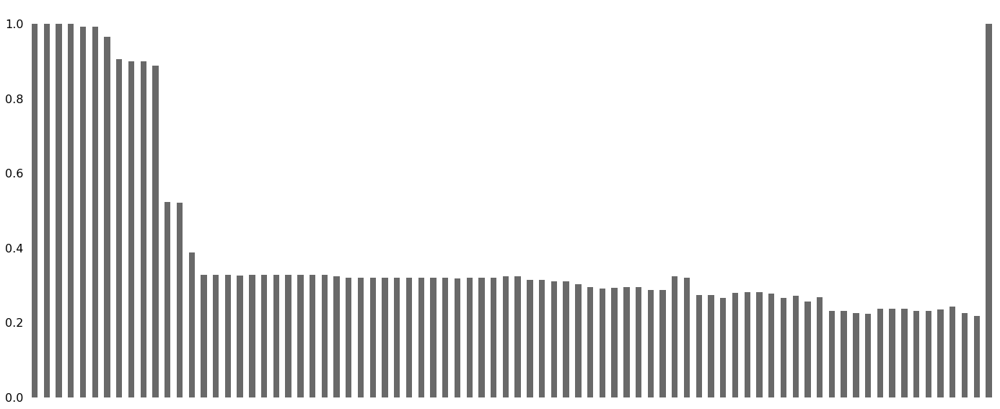

In [136]:
msno.bar(df_train);

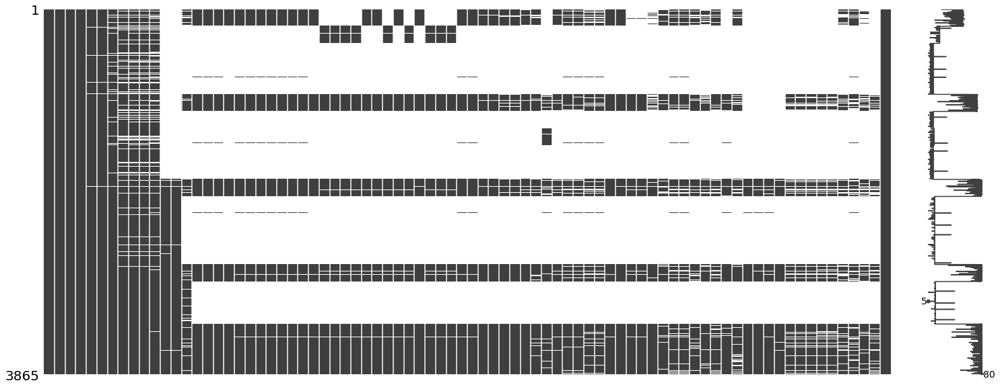

In [137]:
msno.matrix(df_train)

# Fancyimpute KNN


In [1]:
pip install fancyimpute

Note: you may need to restart the kernel to use updated packages.


  ERROR: Command errored out with exit status 1:
   command: 'C:\Users\ytask\Anaconda3\python.exe' -u -c 'import sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\ytask\\AppData\\Local\\Temp\\pip-install-0i8ccz8d\\ecos\\setup.py'"'"'; __file__='"'"'C:\\Users\\ytask\\AppData\\Local\\Temp\\pip-install-0i8ccz8d\\ecos\\setup.py'"'"';f=getattr(tokenize, '"'"'open'"'"', open)(__file__);code=f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' bdist_wheel -d 'C:\Users\ytask\AppData\Local\Temp\pip-wheel-kwnztl_o'
       cwd: C:\Users\ytask\AppData\Local\Temp\pip-install-0i8ccz8d\ecos\
  Complete output (12 lines):
  running bdist_wheel
  running build
  running build_py
  creating build
  creating build\lib.win-amd64-3.7
  creating build\lib.win-amd64-3.7\ecos
  copying src\ecos\ecos.py -> build\lib.win-amd64-3.7\ecos
  copying src\ecos\version.py -> build\lib.win-amd64-3.7\ecos
  copying src\ecos\__init__.py -> build\lib.win-amd64-3.7\

  Using cached ecos-2.0.7.post1.tar.gz (126 kB)
  Using cached osqp-0.6.1-cp37-cp37m-win_amd64.whl (156 kB)
  Using cached scs-2.1.2.tar.gz (3.5 MB)
  Running setup.py clean for ecos
  Running setup.py clean for scs
Failed to build ecos scs
    Running setup.py install for ecos: started
    Running setup.py install for ecos: finished with status 'error'


  ----------------------------------------
  ERROR: Failed building wheel for ecos
  ERROR: Command errored out with exit status 1:
   command: 'C:\Users\ytask\Anaconda3\python.exe' -u -c 'import sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\ytask\\AppData\\Local\\Temp\\pip-install-0i8ccz8d\\scs\\setup.py'"'"'; __file__='"'"'C:\\Users\\ytask\\AppData\\Local\\Temp\\pip-install-0i8ccz8d\\scs\\setup.py'"'"';f=getattr(tokenize, '"'"'open'"'"', open)(__file__);code=f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' bdist_wheel -d 'C:\Users\ytask\AppData\Local\Temp\pip-wheel-_0soak4x'
       cwd: C:\Users\ytask\AppData\Local\Temp\pip-install-0i8ccz8d\scs\
  Complete output (76 lines):
  Namespace(blas64=False, extraverbose=False, float32=False, gpu=False, int32=False, scs=False)
  running bdist_wheel
  running build
  running build_py
  creating build
  creating build\lib.win-amd64-3.7
  creating build\lib.win-amd64-3.7\scs
  co

In [5]:
from fancyimpute import KNN

Using TensorFlow backend.


In [6]:
array = KNN(k=5).fit_transform(df_train.iloc[:,2:])

Imputing row 1/3865 with 42 missing, elapsed time: 9.156
Imputing row 101/3865 with 27 missing, elapsed time: 9.347
Imputing row 201/3865 with 59 missing, elapsed time: 9.583
Imputing row 301/3865 with 59 missing, elapsed time: 9.957
Imputing row 401/3865 with 68 missing, elapsed time: 10.239
Imputing row 501/3865 with 69 missing, elapsed time: 10.576
Imputing row 601/3865 with 68 missing, elapsed time: 10.881
Imputing row 701/3865 with 68 missing, elapsed time: 11.149
Imputing row 801/3865 with 73 missing, elapsed time: 11.417
Imputing row 901/3865 with 68 missing, elapsed time: 11.717
Imputing row 1001/3865 with 15 missing, elapsed time: 11.780
Imputing row 1101/3865 with 68 missing, elapsed time: 11.872
Imputing row 1201/3865 with 68 missing, elapsed time: 12.143
Imputing row 1301/3865 with 72 missing, elapsed time: 12.450
Imputing row 1401/3865 with 67 missing, elapsed time: 12.729
Imputing row 1501/3865 with 73 missing, elapsed time: 13.039
Imputing row 1601/3865 with 68 missing, 

In [7]:
df = pd.DataFrame(array, columns=df_train.columns[2:])
df.head()

,existence expectancy index,existence expectancy at birth,Gross income per capita,Income Index,Expected years of education (galactic years),Mean years of education (galactic years),Intergalactic Development Index (IDI),Education Index,"Intergalactic Development Index (IDI), Rank",Population using at least basic drinking-water services (%),...,"Intergalactic Development Index (IDI), female","Intergalactic Development Index (IDI), male",Gender Development Index (GDI),"Intergalactic Development Index (IDI), female, Rank","Intergalactic Development Index (IDI), male, Rank",Adjusted net savings,"Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total",Private galaxy capital flows (% of GGP),Gender Inequality Index (GII),y
0,0.628657,63.125200,27109.234310,0.646039,8.240543,9.055788,0.762194,0.701067,155.362503,103.039019,...,0.662946,0.757762,0.958447,142.249809,148.910303,18.757294,6.712138,25.312534,0.740432,0.052590
1,0.818082,81.004994,30166.793958,0.852246,10.671823,4.742470,0.833624,0.467873,152.522198,109.519388,...,0.926271,0.841496,1.060508,127.585239,111.528921,19.177926,4.639512,22.785018,0.593099,0.059868
2,0.659443,59.570534,8441.707353,0.499762,8.840316,5.583973,0.469110,0.363837,209.813266,88.945781,...,0.615450,0.651132,0.909064,172.953141,165.904526,21.151265,6.534020,23.137051,0.850509,0.050449
3,0.555862,52.333293,24172.701334,0.631111,15.813324,8.011621,0.702399,0.553356,195.824725,84.744671,...,0.415911,0.498617,0.829591,183.873389,180.730458,21.195738,5.912194,23.919705,0.815277,0.049394
4,0.991196,81.802464,81033.956906,1.131163,13.800672,13.188907,0.910341,0.918353,71.885345,112.576908,...,1.063890,1.045409,1.063318,60.929937,58.685916,34.820802,5.611753,37.118916,0.357290,0.154247


In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3865 entries, 0 to 3864
Data columns (total 78 columns):
 #   Column                                                                                   Non-Null Count  Dtype  
---  ------                                                                                   --------------  -----  
 0   existence expectancy index                                                               3865 non-null   float64
 1   existence expectancy at birth                                                            3865 non-null   float64
 2   Gross income per capita                                                                  3865 non-null   float64
 3   Income Index                                                                             3865 non-null   float64
 4   Expected years of education (galactic years)                                             3865 non-null   float64
 5   Mean years of education (galactic years)                      

# Models

In [8]:
from sklearn.preprocessing import StandardScaler, scale
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, KFold, GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, Lasso, LassoCV, ElasticNet, ElasticNetCV
from sklearn.cross_decomposition import PLSRegression, PLSSVD
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import BaggingRegressor

In [9]:
X = df.drop(["y"], axis = 1)
y = df["y"].values

X_scaled = StandardScaler().fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.25, random_state = 42)

In [10]:
type(y_train)

numpy.ndarray

### Linear Regression

In [18]:
model = LinearRegression().fit(X_train, y_train)
print("Train RMSE: ",mean_squared_error(y_train, model.predict(X_train), squared=False))
print("Test RMSE: ",mean_squared_error(y_test, model.predict(X_test), squared=False))

val_train_error = -cross_val_score(model, X_train, y_train, cv=10, scoring="neg_root_mean_squared_error").mean()
val_test_error = -cross_val_score(model, X_test, y_test, cv=10, scoring="neg_root_mean_squared_error").mean()

print("Validated Train RMSE: ", val_train_error)
print("Validated Test RMSE: ", val_test_error)

Train RMSE:  0.03523330171401039
Test RMSE:  0.03825078922300989
Validated Train RMSE:  0.03624320034919501
Validated Test RMSE:  0.039092489778148845


### PCR

In [19]:
pca = PCA()
XR_train = pca.fit_transform(scale(X_train))

lr = LinearRegression()
pcr_model = lr.fit(XR_train, y_train)

y_pred = pcr_model.predict(XR_train)
print("Train RMSE: ", mean_squared_error(y_train, y_pred, squared=False))

pca2 = PCA()
XR_test = pca2.fit_transform(scale(X_test))
y_pred = pcr_model.predict(XR_test)
print("Test RMSE: ", mean_squared_error(y_test, y_pred, squared=False))

Train RMSE:  0.03523330171401039
Test RMSE:  0.04735391803374117


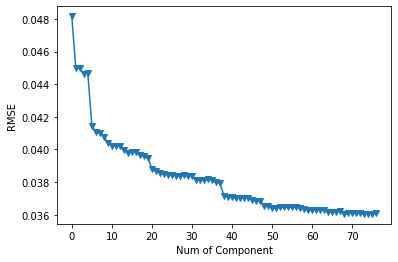

In [20]:
lr = LinearRegression()

cv_10 = KFold(n_splits = 10,
              shuffle = True,
              random_state = 1)

RMSE = []

for i in np.arange(1, XR_train.shape[1] + 1):
    score = (-1*cross_val_score(lr, 
                                XR_train[:,:i], 
                                y_train.ravel(), 
                                cv=cv_10, 
                                scoring='neg_root_mean_squared_error').mean())
    RMSE.append(score)
    
plt.plot(RMSE, '-v')
plt.xlabel('Num of Component')
plt.ylabel('RMSE')
plt.show()

In [21]:
lr = LinearRegression()
pcr_model = lr.fit(XR_train[:,:76], y_train)
y_pred = pcr_model.predict(XR_train[:,:76])
print("Train RMSE: ", mean_squared_error(y_train, y_pred, squared=False))
y_pred = pcr_model.predict(XR_test[:,:76])
print("Test RMSE: ", mean_squared_error(y_test, y_pred, squared=False))


Train RMSE:  0.03523332760509616
Test RMSE:  0.047353551997166024


### PLS

In [22]:
pls_model = PLSRegression().fit(X_train, y_train)

print("Train RMSE: ", mean_squared_error(y_train, pls_model.predict(X_train), squared=False))
print("Test RMSE: ", mean_squared_error(y_test, pls_model.predict(X_test), squared=False))

Train RMSE:  0.04125383185862076
Test RMSE:  0.04294508019771758


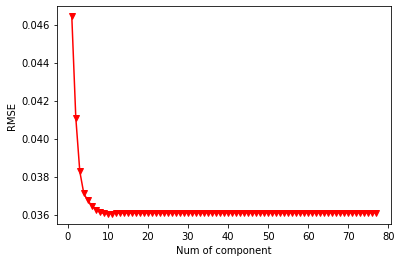

In [23]:
cv_10 = KFold(n_splits=10, shuffle=True, random_state=1)

RMSE = []

for i in np.arange(1, X_train.shape[1] + 1):
    pls = PLSRegression(n_components=i)
    score = -1*cross_val_score(pls, X_train, y_train, cv=cv_10, scoring='neg_root_mean_squared_error').mean()
    RMSE.append(score)

#Sonuçların Görselleştirilmesi
plt.plot(np.arange(1, X_train.shape[1] + 1), np.array(RMSE), '-v', c = "r")
plt.xlabel('Num of component')
plt.ylabel('RMSE')
plt.show()

In [25]:
pls_model = PLSRegression(n_components=10).fit(X_train, y_train)
y_pred = pls_model.predict(X_test)
print("Test RMSE: ", mean_squared_error(y_test, y_pred, squared=False))

Test RMSE:  0.03827787514798216


### Ridge

In [38]:
ridge_model = Ridge(alpha=0.1).fit(X_train, y_train)
print("Train RMSE: ", mean_squared_error(y_train, ridge_model.predict(X_train), squared=False))
print("Test RMSE: ", mean_squared_error(y_test, ridge_model.predict(X_test), squared=False))

Train RMSE:  0.03523330202489211
Test RMSE:  0.03825045790388911


In [50]:
lambdas = 10**np.linspace(10,-2,100)*0.5 
ridge_cv = RidgeCV(alphas = lambdas, 
                   scoring = "neg_root_mean_squared_error")

ridge_cv.fit(X_train, y_train)
print(ridge_cv.alpha_)

50.0


In [81]:
ridge_tuned = Ridge(alpha=ridge_cv.alpha_).fit(X_train, y_train)

print("Train RMSE: ", mean_squared_error(y_train, ridge_tuned.predict(X_train), squared=False))
print("Test RMSE: ", mean_squared_error(y_test, ridge_tuned.predict(X_test), squared=False))

val_train_error = -cross_val_score(ridge_tuned, X_train, y_train, cv=10, scoring="neg_root_mean_squared_error").mean()
val_test_error = -cross_val_score(ridge_tuned, X_test, y_test, cv=10, scoring="neg_root_mean_squared_error").mean()
print("Val Train RMSE: ", val_train_error)
print("Val Test RMSE: ", val_test_error)

Train RMSE:  0.03528369985440924
Test RMSE:  0.03815943216508486
Val Train RMSE:  0.03616570442108877
Val Test RMSE:  0.03842236158765562


### Lasso

In [54]:
lasso_cv = LassoCV(alphas=None,
                   cv=10,
                   max_iter=10000)

lasso_cv.fit(X_train, y_train)
print(lasso_cv.alpha_)

9.940205471168398e-05


In [80]:
lasso_tuned = Lasso(alpha=lasso_cv.alpha_).fit(X_train, y_train)
print("Train RMSE: ", mean_squared_error(y_train, lasso_tuned.predict(X_train), squared=False))
print("Test RMSE: ", mean_squared_error(y_test, lasso_tuned.predict(X_test), squared=False))
val_train_error = -cross_val_score(lasso_tuned, X_train, y_train, cv=10, scoring="neg_root_mean_squared_error").mean()
val_test_error = -cross_val_score(lasso_tuned, X_test, y_test, cv=10, scoring="neg_root_mean_squared_error").mean()
print("Val Train RMSE: ", val_train_error)
print("Val Test RMSE: ", val_test_error)

Train RMSE:  0.035299572355374426
Test RMSE:  0.0381234817528187
Val Train RMSE:  0.03619062722474978
Val Test RMSE:  0.038615175792669


### ElasticNet

In [57]:
enet_cv = ElasticNetCV(cv=10, random_state=42).fit(X_train, y_train)
print(enet_cv.alpha_)

0.00019880410942336817


In [79]:
enet_tuned = ElasticNet(alpha=enet_cv.alpha_).fit(X_train, y_train)
print("Train RMSE: ", mean_squared_error(y_train, enet_tuned.predict(X_train), squared=False))
print("Test RMSE: ", mean_squared_error(y_test, enet_tuned.predict(X_test), squared=False))
val_train_error = -cross_val_score(enet_tuned, X_train, y_train, cv=10, scoring="neg_root_mean_squared_error").mean()
val_test_error = -cross_val_score(enet_tuned, X_test, y_test, cv=10, scoring="neg_root_mean_squared_error").mean()
print("Val Train RMSE: ", val_train_error)
print("Val Test RMSE: ", val_test_error)

Train RMSE:  0.03529994323474874
Test RMSE:  0.03812317965696709
Val Train RMSE:  0.03619020807288611
Val Test RMSE:  0.03861327666973202


### KNN

In [71]:
params = {'n_neighbors': np.arange(1,30,1), 'leaf_size' : np.arange(1,50,5)}
knn = KNeighborsRegressor()
knn_cv = GridSearchCV(knn, params, cv=10, n_jobs=-1)
knn_cv.fit(X_train, y_train)

GridSearchCV(cv=10, error_score=nan,
             estimator=KNeighborsRegressor(algorithm='auto', leaf_size=30,
                                           metric='minkowski',
                                           metric_params=None, n_jobs=None,
                                           n_neighbors=5, p=2,
                                           weights='uniform'),
             iid='deprecated', n_jobs=-1,
             param_grid={'leaf_size': array([ 1,  6, 11, 16, 21, 26, 31, 36, 41, 46]),
                         'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [77]:
print(knn_cv.best_params_)

{'leaf_size': 1, 'n_neighbors': 12}


In [75]:
knn_tuned = KNeighborsRegressor(n_neighbors = knn_cv.best_params_["n_neighbors"], leaf_size = knn_cv.best_params_["leaf_size"])
knn_tuned.fit(X_train, y_train)
print("Train RMSE: ", mean_squared_error(y_train, knn_tuned.predict(X_train), squared=False))
print("Test RMSE: ", mean_squared_error(y_test, knn_tuned.predict(X_test), squared=False))

Train RMSE:  0.029088572221716208
Test RMSE:  0.03213692479475449


In [78]:
val_train_error = -cross_val_score(knn_tuned, X_train, y_train, cv=10, scoring="neg_root_mean_squared_error").mean()
val_test_error = -cross_val_score(knn_tuned, X_test, y_test, cv=10, scoring="neg_root_mean_squared_error").mean()
print("Val Train RMSE: ", val_train_error)
print("Val Test RMSE: ", val_test_error)

Val Train RMSE:  0.031478160920749544
Val Test RMSE:  0.03450127512645732


### SVM

In [12]:
from sklearn.svm import SVR


In [82]:
params = {"C": np.arange(0.1,2,0.1), "epsilon" : [0.01, 0.05, 0.1, 0.2, 0.5, 1]}
svm = SVR("linear")
svm_cv = GridSearchCV(svm, params, cv=10, n_jobs=-1)
svm_cv.fit(X_train, y_train)

GridSearchCV(cv=10, error_score=nan,
             estimator=SVR(C=1.0, cache_size=200, coef0=0.0, degree=3,
                           epsilon=0.1, gamma='scale', kernel='linear',
                           max_iter=-1, shrinking=True, tol=0.001,
                           verbose=False),
             iid='deprecated', n_jobs=-1,
             param_grid={'C': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. , 1.1, 1.2, 1.3,
       1.4, 1.5, 1.6, 1.7, 1.8, 1.9]),
                         'epsilon': [0.01, 0.05, 0.1, 0.2, 0.5, 1]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [83]:
print(svm_cv.best_params_)

{'C': 0.30000000000000004, 'epsilon': 0.01}


In [13]:
svm_tuned = SVR(C= 0.3, epsilon =  0.01)
svm_tuned.fit(X_train, y_train)
print("Train RMSE: ", mean_squared_error(y_train, svm_tuned.predict(X_train), squared=False))
print("Test RMSE: ", mean_squared_error(y_test, svm_tuned.predict(X_test), squared=False))

Train RMSE:  0.019733299621995628
Test RMSE:  0.029798013817800305


In [14]:
val_train_error = -cross_val_score(svm_tuned, X_train, y_train, cv=10, scoring="neg_root_mean_squared_error").mean()
val_test_error = -cross_val_score(svm_tuned, X_test, y_test, cv=10, scoring="neg_root_mean_squared_error").mean()
print("Val Train RMSE: ", val_train_error)
print("Val Test RMSE: ", val_test_error)

Val Train RMSE:  0.029191026243125272
Val Test RMSE:  0.032587153217084455


# Test

In [16]:
df_test.tail()

,galactic year,galaxy,existence expectancy index,existence expectancy at birth,Gross income per capita,Income Index,Expected years of education (galactic years),Mean years of education (galactic years),Intergalactic Development Index (IDI),Education Index,...,Current health expenditure (% of GGP),"Intergalactic Development Index (IDI), female","Intergalactic Development Index (IDI), male",Gender Development Index (GDI),"Intergalactic Development Index (IDI), female, Rank","Intergalactic Development Index (IDI), male, Rank",Adjusted net savings,"Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total",Private galaxy capital flows (% of GGP),Gender Inequality Index (GII)
885,1016064,ESO 383-087 (ISG 39),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
886,1016064,NGC 247,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
887,1016064,ESO 325-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
888,1016064,ESO 540-032,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
889,1016064,KK98 77,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [17]:
array = KNN(k=5).fit_transform(df_test.iloc[:,2:])

Imputing row 1/890 with 65 missing, elapsed time: 0.311
Imputing row 101/890 with 65 missing, elapsed time: 0.361
Imputing row 201/890 with 65 missing, elapsed time: 0.397
Imputing row 301/890 with 65 missing, elapsed time: 0.431
Imputing row 401/890 with 0 missing, elapsed time: 0.469
Imputing row 501/890 with 65 missing, elapsed time: 0.502
Imputing row 601/890 with 1 missing, elapsed time: 0.548
Imputing row 701/890 with 0 missing, elapsed time: 0.578
Imputing row 801/890 with 1 missing, elapsed time: 0.620
[KNN] Warning: 385/68530 still missing after imputation, replacing with 0


In [24]:
dff = pd.DataFrame(array, columns=df_test.columns[2:])

In [18]:
array.shape

(890, 77)

In [20]:
test_scaled = StandardScaler().fit_transform(array)

In [21]:
y_pred = svm_tuned.predict(test_scaled)

In [78]:
dff["pred"] = y_pred

In [79]:
dff.tail(10)

,existence expectancy index,existence expectancy at birth,Gross income per capita,Income Index,Expected years of education (galactic years),Mean years of education (galactic years),Intergalactic Development Index (IDI),Education Index,"Intergalactic Development Index (IDI), Rank",Population using at least basic drinking-water services (%),...,"Intergalactic Development Index (IDI), male",Gender Development Index (GDI),"Intergalactic Development Index (IDI), female, Rank","Intergalactic Development Index (IDI), male, Rank",Adjusted net savings,"Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total",Private galaxy capital flows (% of GGP),Gender Inequality Index (GII),y_pred,pred
880,1.169012,93.164456,52952.391742,1.095524,21.199219,14.764076,1.005182,0.894462,85.283755,117.747665,...,0.988741,1.096980,50.404251,79.361605,24.853515,3.840307,21.188995,0.245709,0.201513,0.201513
881,1.173076,89.891307,61968.904515,0.956639,18.975100,14.623960,1.009860,1.051840,74.392430,123.692855,...,1.069960,1.069114,51.133030,37.127358,33.227767,4.051122,25.875299,0.272172,0.270862,0.270862
882,1.196506,93.255472,52940.390947,1.083053,20.329842,12.973617,0.998458,0.866121,97.766636,115.892493,...,0.990183,1.096568,51.102525,79.103375,24.687341,3.920660,21.323920,0.248267,0.192354,0.192354
883,1.199043,95.612189,86354.505430,1.249232,18.977184,16.340620,1.182794,0.935110,63.195736,112.414005,...,1.154597,1.058543,52.678325,55.033820,52.752235,5.769537,40.579937,0.298094,0.268291,0.268291
884,1.250508,92.762049,51052.221356,1.096361,18.848991,14.880592,1.029416,1.063418,63.325957,108.010582,...,1.056042,1.111348,73.175187,62.522834,15.160151,5.296301,28.204217,0.345021,0.200401,0.200401
885,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.088125,0.088125
886,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.088125,0.088125
887,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.088125,0.088125
888,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.088125,0.088125
889,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.088125,0.088125


In [155]:
dff_poor = dff[dff["existence expectancy index"]<0.7]

In [156]:
index_poor = dff_poor.index

In [157]:
index_poor

Int64Index([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
             13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
             26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
             39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
             52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
             65, 885, 886, 887, 888, 889],
           dtype='int64')

In [158]:
dff_rich = dff.drop(index_poor, axis=0)

In [159]:
index_rich = dff_rich.index

In [34]:
potential_increase = -np.log(y_pred + 0.01)+3
y = potential_increase ** 2 / 1000

In [32]:
from scipy.optimize import minimize

In [311]:
def objective1(x):
    return -sum(x*y[index_rich])

def constraint1(x):
    return sum(x) - 45000

def objective2(x):
    return -sum(x*y[index_poor])

def constraint2(x):
    return sum(x) - 5000

x0 = [45000/819] * 819
b = [0.0, 100.0]
bnds1 = [b] * 819

con1 = [{"type" : "eq", "fun" : constraint1}]

x1 = [5000/71] * 71
bnds2 = [b] * 71

con2 = [{"type" : "eq", "fun" : constraint2}]


In [178]:
sol1 = minimize(objective1, x0, method = 'SLSQP', bounds=bnds1, constraints=con1)

In [312]:
sol2 = minimize(objective2, x1, method = 'SLSQP', bounds=bnds2, constraints=con2)

In [355]:
opt_pred = np.zeros((890))

In [356]:
opt_pred[index_rich] = sol1.x 

In [357]:
opt_pred[index_poor] = sol2.x

In [358]:
opt_pred = np.around(opt_pred, decimals=1)
c=0
for i, x in enumerate(opt_pred[index_poor]):
    if x < 99.8:
        opt_pred[index_poor[i]] += 0.1
        c+=1
        
    if c ==2:
        break

opt_pred[-1] += 0.5

In [359]:
opt_pred.sum()

50000.0

In [360]:
opt_pred[index_poor].sum()

5000.9

In [361]:
dff["opt_pred"] = opt_pred

In [362]:
last = dff[["pred", "opt_pred"]]

In [363]:
last.to_csv("solution.csv" ,header=["pred", "opt_pred"])